<a href="https://colab.research.google.com/github/jeyvong/hw_2.1.44/blob/main/example_rus_seq2seq_with_without_attention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Seq2Seq and Attention

**ВАЖНО**<br>
Включите ** Ускорение графического процессора**, перейдя в *Среда выполнения > Изменить тип среды выполнения*. Имейте в виду, что на определенных уровнях вам не гарантирован доступ к графическому процессору в зависимости от истории использования и текущей нагрузки.
<br><br>
Кроме того, если вы запускаете это в облаке, а не на локальном сервере Jupyter на своем компьютере, то после некоторого периода бездействия ноутбук отключится.
<br><br>
Обратитесь к этой ссылке о том, как запустить Colab notebook локально на вашем компьютере, чтобы избежать этой проблемы:<br>
https://research.google.com/colaboratory/local-runtimes.html

In [ ]:
import io
import json
import numpy as np
import pandas as pd
import random
import re
import tensorflow as tf
from tensorflow import keras

from keras import layers
from keras.utils import pad_sequences

from sklearn.model_selection import train_test_split

# Реккурентный машинный перевод Seq2Seq **Без** Attention

Наша первая модель будет использовать всего две основы (один кодер и один декодер) для перевода с русского на английский. Здесь мы остановимся на русском, потому что это сложный язык, с которым трудно справиться, имея мало ресурсов.
<br><br>
Набор данных, который мы будем использовать, взят из открытых источников. Аналогичный набор можно взять из  коллекции переводов предложений на различные языки, полученных от добровольцев:
<br>
https://tatoeba.org/ru/sentences/search?from=rus&query=&to=eng

In [ ]:
# Скачаем обучающий набор.
dataset = pd.read_csv('https://raw.githubusercontent.com/tanishqgautam/Seq2seq-Machine-Translation-with-Attention/main/dataset/train.csv')

In [ ]:
dataset

,rus,eng
0,мы делаем что хотим,we do what we want
1,тебе не скучно одной,don't you get bored when you're alone
2,том любит меня,tom loves me
3,том очень ленивый,tom is very lazy
4,эту аудиокнигу стоит послушать,this audiobook is worth listening to
...,...,...
187048,том уже об этом знает,tom already knows about this
187049,приятно было снова тебя увидеть,it was nice to see you again
187050,можно за тобой заехать,can i pick you up
187051,я выиграл состязание,i won the contest


In [ ]:
train_ratio = 0.5
validation_ratio = 0.1
test_ratio = 0.1

dataset_input, dataset_target = dataset['rus'].to_list(), dataset['eng'].to_list()

x_train, x_test, y_train, y_test = train_test_split(dataset_input, dataset_target, test_size=1 - train_ratio)

x_val, x_test, y_val, y_test = train_test_split(x_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio))



In [ ]:
len(x_train)

93526

In [ ]:
print(x_train[:10])
print(y_train[:10])

['мне хватит', 'вы можете вызвать мне такси', 'я бедный человек', 'этому дереву больше сотни лет', 'том спал на раскладном диване', 'который мой', 'я сегодня купил новую гитару', 'где ваш дом', 'давайте я измерю вам температуру', 'том уважал мэри']
["i've had my fill", 'can you call a taxi for me', "i'm a poor man", 'this tree is more than a century old', 'tom slept on the pull-out sofa', 'which is mine', 'i bought a new guitar today', "where's your home", 'let me take your temperature', 'tom respected mary']


Мы создаем модель перевода на основе ** слова **, но мы по-прежнему хотим сохранить знаки препинания и рассматривать их как отдельные токены, поэтому мы вставим пробел между любыми соответствующими знаками препинания и символами вокруг них. Таким образом, наш токенизатор (который не будет отфильтровывать знаки препинания) будет выводить знаки препинания в виде отдельных токенов.

In [ ]:
def preprocess_sentence(s):
  s = re.sub(r"([?.!,¿])", r" \1 ", s)
  s = re.sub(r'[" "]+', " ", s)
  s = s.strip()
  return s

In [ ]:
# Предварительно обработаем как исходное, так и целевое предложения.
train_preprocessed_input = [preprocess_sentence(s) for s in x_train]
train_preprocessed_target = [preprocess_sentence(s) for s in y_train]

In [ ]:
train_preprocessed_input[:20]

['мне хватит',
 'вы можете вызвать мне такси',
 'я бедный человек',
 'этому дереву больше сотни лет',
 'том спал на раскладном диване',
 'который мой',
 'я сегодня купил новую гитару',
 'где ваш дом',
 'давайте я измерю вам температуру',
 'том уважал мэри',
 'вы должны сохранять спокойствие',
 'обе партии выступали против войны',
 'невежество всегда порождает страх',
 'ты всё понял',
 'мне надо выяснить что происходит',
 'я не чувствую себя обманутым',
 'вас все любили',
 'как тебе яйца приготовить',
 'где и когда мы встретимся',
 'он делает это быстро']

Мы будем использовать **Teacher Forcing** с нашей моделью перевода (в частности, с декодером). Добавим теги начала предложения (_\<sos\>_) и теги конца предложения (_\<eos\>_) в начале и конце каждого целевого предложения соответственно.

In [ ]:
def tag_target_sentences(sentences):
  tagged_sentences = map(lambda s: (' ').join(['<sos>', s, '<eos>']), sentences)
  return list(tagged_sentences)

In [ ]:
train_tagged_preprocessed_target = tag_target_sentences(train_preprocessed_target)

In [ ]:
train_tagged_preprocessed_target[:3]

["<sos> i've had my fill <eos>",
 '<sos> can you call a taxi for me <eos>',
 "<sos> i'm a poor man <eos>"]

Далее выделим вводные и целевые предложения, позаботившись о том, чтобы сохранить соответствующую пунктуацию.<br>
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer
<br><br>
Обратите внимание, что мы также включаем токен вне словаря (_\<unk\>_) в инициализацию токенизатора. Во время вывода, если токенизатор встретит слово, которое он не видел во время начальной подгонки обучающих данных, это слово будет заменено на _\<unk\>_, и системе перевода нужно будет справиться с этим.

In [ ]:
# Токенизатор для вводимых предложений на русском
source_tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token='<unk>', filters='"#$%&()*+-/:;=@[\\]^_`{|}~\t\n')
source_tokenizer.fit_on_texts(train_preprocessed_input)
source_tokenizer.get_config()

{'num_words': None,
 'filters': '"#$%&()*+-/:;=@[\\]^_`{|}~\t\n',
 'lower': True,
 'split': ' ',
 'char_level': False,
 'oov_token': '<unk>',
 'document_count': 93526,
 'word_counts': '{"\\u043c\\u043d\\u0435": 4583, "\\u0445\\u0432\\u0430\\u0442\\u0438\\u0442": 93, "\\u0432\\u044b": 5331, "\\u043c\\u043e\\u0436\\u0435\\u0442\\u0435": 356, "\\u0432\\u044b\\u0437\\u0432\\u0430\\u0442\\u044c": 17, "\\u0442\\u0430\\u043a\\u0441\\u0438": 70, "\\u044f": 17177, "\\u0431\\u0435\\u0434\\u043d\\u044b\\u0439": 9, "\\u0447\\u0435\\u043b\\u043e\\u0432\\u0435\\u043a": 250, "\\u044d\\u0442\\u043e\\u043c\\u0443": 137, "\\u0434\\u0435\\u0440\\u0435\\u0432\\u0443": 6, "\\u0431\\u043e\\u043b\\u044c\\u0448\\u0435": 579, "\\u0441\\u043e\\u0442\\u043d\\u0438": 8, "\\u043b\\u0435\\u0442": 152, "\\u0442\\u043e\\u043c": 16812, "\\u0441\\u043f\\u0430\\u043b": 72, "\\u043d\\u0430": 3277, "\\u0440\\u0430\\u0441\\u043a\\u043b\\u0430\\u0434\\u043d\\u043e\\u043c": 1, "\\u0434\\u0438\\u0432\\u0430\\u043d\\u0435": 21

In [ ]:
source_vocab_size = len(source_tokenizer.word_index) + 1
print(source_vocab_size)

27003


In [ ]:
# Токенизатор для вводимых предложений на английском
target_tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token='<unk>', filters='"#$%&()*+-/:;=@[\\]^_`{|}~\t\n')
target_tokenizer.fit_on_texts(train_tagged_preprocessed_target)
target_tokenizer.get_config()

{'num_words': None,
 'filters': '"#$%&()*+-/:;=@[\\]^_`{|}~\t\n',
 'lower': True,
 'split': ' ',
 'char_level': False,
 'oov_token': '<unk>',
 'document_count': 93526,
 'word_counts': '{"<sos>": 93526, "i\'ve": 1101, "had": 621, "my": 2978, "fill": 25, "<eos>": 93526, "can": 1871, "you": 18716, "call": 517, "a": 10920, "taxi": 59, "for": 3037, "me": 4506, "i\'m": 3880, "poor": 63, "man": 249, "this": 4179, "tree": 113, "is": 10330, "more": 489, "than": 607, "century": 3, "old": 352, "tom": 22475, "slept": 56, "on": 2078, "the": 13604, "pull": 20, "out": 966, "sofa": 21, "which": 244, "mine": 209, "i": 16855, "bought": 335, "new": 375, "guitar": 31, "today": 588, "where\'s": 186, "your": 3542, "home": 772, "let": 582, "take": 827, "temperature": 22, "respected": 12, "mary": 2173, "must": 456, "remain": 22, "calm": 53, "both": 371, "parties": 8, "opposed": 7, "war": 49, "ignorance": 2, "always": 526, "creates": 1, "fear": 24, "have": 3876, "understood": 36, "everything": 403, "got": 949,

In [ ]:
target_vocab_size = len(target_tokenizer.word_index) + 1
print(target_vocab_size)

9893


Далее мы векторизуем вводные и целевые предложения

In [ ]:
train_encoder_inputs = source_tokenizer.texts_to_sequences(train_preprocessed_input)

In [ ]:
print(train_encoder_inputs[:3])
print(source_tokenizer.sequences_to_texts(train_encoder_inputs[:3]))

[[10, 421], [7, 118, 2117, 10, 552], [2, 3567, 174]]
['мне хватит', 'вы можете вызвать мне такси', 'я бедный человек']


Мы создадим две копии каждого векторизованного ** целевого** предложения, причем вторая копия будет сдвинута на единицу.

Приведенная ниже функция берет набор предложений, векторизует их, затем возвращает по две копии каждого. Первый будет включать в себя все токены, кроме последнего, второй будет включать в себя все токены, кроме первого.

In [ ]:
def generate_decoder_inputs_targets(sentences, tokenizer):
  seqs = tokenizer.texts_to_sequences(sentences)
  decoder_inputs = [s[:-1] for s in seqs] # Drop the last token in the sentence.
  decoder_targets = [s[1:] for s in seqs] # Drop the first token in the sentence.

  return decoder_inputs, decoder_targets

In [ ]:
train_decoder_inputs, train_decoder_targets = generate_decoder_inputs_targets(train_tagged_preprocessed_target,
                                                                              target_tokenizer)

Каждый токен предложения *decoder_input* будет передан в декодер как ** next ** ожидаемый токен, и каждый токен предложения *decoder_target* будет использоваться для вычисления потерь по сравнению с фактическим выходом декодера; точно так, как мы рассмотрели на слайдах.

In [ ]:
print(train_decoder_inputs[0], train_decoder_targets[0])

print(target_tokenizer.sequences_to_texts(train_decoder_inputs[:1]),
      target_tokenizer.sequences_to_texts(train_decoder_targets[:1]))

[2, 66, 110, 29, 1391] [66, 110, 29, 1391, 3]
["<sos> i've had my fill"] ["i've had my fill <eos>"]


In [ ]:
max_encoding_len = len(max(train_encoder_inputs, key=len))
max_encoding_len

6

In [ ]:
max_decoding_len = len(max(train_decoder_inputs, key=len))
max_decoding_len

16

In [ ]:
padded_train_encoder_inputs = pad_sequences(train_encoder_inputs, max_encoding_len, padding='post', truncating='post')
padded_train_decoder_inputs = pad_sequences(train_decoder_inputs, max_decoding_len, padding='post', truncating='post')
padded_train_decoder_targets = pad_sequences(train_decoder_targets, max_decoding_len, padding='post', truncating='post')

In [ ]:
print(padded_train_encoder_inputs[0])
print(padded_train_decoder_inputs[0])
print(padded_train_decoder_targets[0])

[ 10 421   0   0   0   0]
[   2   66  110   29 1391    0    0    0    0    0    0    0    0    0
    0    0]
[  66  110   29 1391    3    0    0    0    0    0    0    0    0    0
    0    0]


При преобразовании дополненной последовательности обратно в текст заполнение неизвестных заменяется лексемой, не входящей в словарный запас *\<unk\>*.

In [ ]:
target_tokenizer.sequences_to_texts([padded_train_decoder_inputs[0]])

["<sos> i've had my fill <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>"]

Обучающий набор данных теперь готов, и мы можем выполнить те же шаги предварительной обработки, чтобы подготовить проверочный набор данных.

In [ ]:
def process_dataset(input, output):

  # Пометим целевые предложения токенами <sos> и <eos>.
  tagged_preprocessed_output = tag_target_sentences(output)

  # Векторизовать исходные предложения кодировщика.
  encoder_inputs = source_tokenizer.texts_to_sequences(input)

  # Векторизовать и создавать входные данные декодера и целевые предложения.
  decoder_inputs, decoder_targets = generate_decoder_inputs_targets(tagged_preprocessed_output,
                                                                    target_tokenizer)

  # Заполните все коллекции.
  padded_encoder_inputs = pad_sequences(encoder_inputs, max_encoding_len, padding='post', truncating='post')
  padded_decoder_inputs = pad_sequences(decoder_inputs, max_decoding_len, padding='post', truncating='post')
  padded_decoder_targets = pad_sequences(decoder_targets, max_decoding_len, padding='post', truncating='post')

  return padded_encoder_inputs, padded_decoder_inputs, padded_decoder_targets


In [ ]:
# Набор данных для проверки (препроцессинг)
padded_val_encoder_inputs, padded_val_decoder_inputs, padded_val_decoder_targets = process_dataset(x_val, y_val)

Теперь мы готовы к построению нашей модели перевода. Это параметры, которые мы будем использовать (не стесняйтесь пробовать разные значения).

In [ ]:
embedding_dim = 128
hidden_dim = 256
default_dropout=0.2
batch_size = 32
epochs = 1

В отличие от моделей, которые мы создавали до этого момента, эта модель будет иметь ** два** входа:
1. Кодер получает исходные предложения (на венгерском языке) и генерирует входные данные начального состояния для декодера.
2. Декодер получает вводимые декодером предложения (на английском языке) для принудительного использования учителем.
<br>

Поскольку это так, мы не будем использовать последовательный ** API Keras **. Скорее, мы будем использовать ** Functional API **, который даст нам больше гибкости при представлении слоев нашей модели в виде графиков. К счастью, работа остается довольно интуитивной до тех пор, пока мы помним о том, что происходит за кулисами.
<br>

https://keras.io/api/models/sequential /<br>
https://www.tensorflow.org/guide/keras/functional/

Код в следующей ячейке указывает кодировщик. Если вы раньше не использовали ** Functional API **, самое важное, что нужно понять, это следующее: каждый слой подобен _node_ на графике. Каждый раз, когда мы передаем выходные данные одного слоя следующему, это создает связь между двумя _nodes_ и позволяет передавать данные. Как только вся обучающая модель будет построена, мы визуализируем ее для большей наглядности.

In [ ]:
# Начальный входной слой кодировщика, который будет принимать дополненные последовательности
# здесь нет shape, но вы можете указать ее заранее
encoder_inputs = layers.Input(shape=[None], name='encoder_inputs')

# Слой эмбеддингов
encoder_embeddings = layers.Embedding(source_vocab_size,
                                      embedding_dim,
                                      mask_zero=True,
                                      name='encoder_embeddings')

# Передача выходных данных входного слоя встраиваемому слою создает связь
# Входные последовательности теперь будут поступать в слой эмбеддингов, который будет выводить
# sequence of embeddings
encoder_embedding_output = encoder_embeddings(encoder_inputs)


# В этой модели мы не используем какой-либо механизм внимания, поэтому устанавливаем только
# return_state к True. return_sequences остается False.
encoder_lstm = layers.LSTM(hidden_dim,
                           return_state=True,
                           dropout=default_dropout,
                           name='encoder_lstm')

# Передача выходных данных встраиваемого слоя на уровень LSTM создает еще одну ссылку.
# ВАЖНО: LSTM всегда возвращает три значения. Когда return_sequences равен
# False, encoder_outputs и state_h совпадают. Когда return_sequences равен
# True, encoder_outputs содержит скрытые состояния кодера с каждого временного шага.
#
# Дополнительное примечание: мы не будем использовать здесь encoder_outputs, чтобы эта переменная могла быть
# заменяется на _
encoder_outputs, state_h, state_c = encoder_lstm(encoder_embedding_output)

# начальные состояния для декодера.
encoder_states = (state_h, state_c)

Код для указания декодера аналогичен, за исключением трех дополнений:
1. В LSTM для *return_sequences* установлено значение *True*, поскольку нам потребуется вывод скрытого состояния на каждом временном шаге.

2. LSTM декодера принимает значение *initial_state*, значение для которого получено из кодера.

3. В конце есть слой *softmax* для генерации распределения вероятностей по целевому (английскому) словарю.

In [ ]:
decoder_inputs = layers.Input(shape=[None], name='decoder_inputs')


decoder_embeddings = layers.Embedding(target_vocab_size,
                                      embedding_dim,
                                      mask_zero=True,
                                      name='decoder_embeddings')


decoder_embedding_output = decoder_embeddings(decoder_inputs)

# Return sequences - True.
decoder_lstm = layers.LSTM(hidden_dim,
                           return_sequences=True,
                           return_state=True,
                           dropout=default_dropout,
                           name='decoder_lstm')


# Установите начальное состояние декодера на конечные выходные состояния кодера. С
# return_sequences имеет значение True, decoder_outputs будет представлять собой набор
# скрытого состояния декодера на каждом временном шаге. Также обратите внимание, что поскольку нам не нужно
# конечный скрытый вывод декодера и состояния ячеек, они просто установлены в _.
decoder_outputs, _, _ = decoder_lstm(decoder_embedding_output, initial_state=encoder_states)

# В конце добавьте слой softmax, чтобы создать распределение вероятностей для выходного слова.
decoder_dense = layers.Dense(target_vocab_size, activation='softmax', name='decoder_dense')

# Распределение вероятностей для выходного слова.
y_proba = decoder_dense(decoder_outputs)


Теперь мы можем создать нашу модель и указать, что она имеет ** два ** входа и один выход (many-to-one).
<br><br>
Обратите внимание, что *точность* является приблизительным показателем для моделей перевода и просто служит показателем того, как работает наша модель. Точность оценим показателем BLEU.

In [ ]:
# Обратите внимание, как модель принимает два входных сигнала в массиве.
model = tf.keras.Model([encoder_inputs, decoder_inputs], y_proba, name='rus_eng_seq2seq_nmt_no_attention')

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy',  metrics='sparse_categorical_accuracy')
model.summary()

Model: "rus_eng_seq2seq_nmt_no_attention"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 encoder_inputs (InputLayer  [(None, None)]               0         []                            
 )                                                                                                
                                                                                                  
 decoder_inputs (InputLayer  [(None, None)]               0         []                            
 )                                                                                                
                                                                                                  
 encoder_embeddings (Embedd  (None, None, 128)            3456384   ['encoder_inputs[0][0]']      
 ing)                                                              

Мы можем визуализировать нашу модель, чтобы получить лучшее представление о построенном нами потоке.

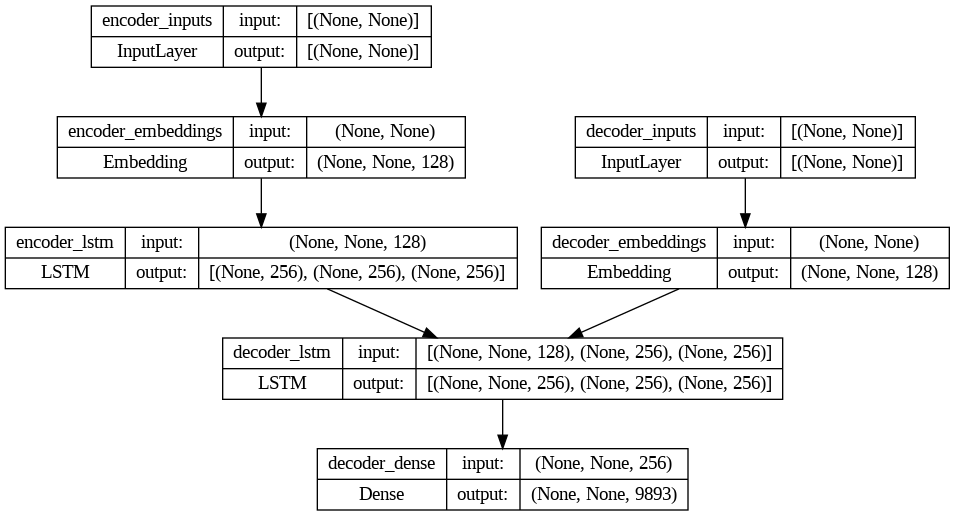

In [ ]:
from keras.utils import plot_model

plot_model(model, to_file='rus_eng_seq2seq_nmt_no_attention.png', show_shapes=True, show_layer_names=True)

Итак, вот измерения, с которыми мы работаем в этой модели обучения.

In [ ]:
print('encoder_inputs layer\n input dimension {}\n output dimension: {}'.format((batch_size, max_encoding_len), (batch_size, max_encoding_len)))
print()
print('encoder_embeddings layer\n input dimension {}\n output dimension: {}'.format((batch_size, max_encoding_len), (batch_size, max_encoding_len, embedding_dim)))
print()
print('encoder_lstm layer\n input dimension {}\n output dimension: {}'.format((batch_size, max_encoding_len, embedding_dim), [(batch_size, hidden_dim), (batch_size, hidden_dim), (batch_size, hidden_dim)]))
print()
print()
print('decoder_inputs layer\n input dimension {}\n output dimension: {}'.format((batch_size, max_decoding_len), (batch_size, max_decoding_len)))
print()
print('decoder_embeddings layer\n input dimension {}\n output dimension: {}'.format((batch_size, max_decoding_len), (batch_size, max_decoding_len, embedding_dim)))
print()
print('decoder_lstm layer\n input dimension {}\n output dimension: {}'.format([(batch_size, max_decoding_len, embedding_dim), (batch_size, hidden_dim), (batch_size, hidden_dim)], [(batch_size, max_decoding_len, hidden_dim), (batch_size, hidden_dim), (batch_size, hidden_dim)]))
print()
print('decoder_dense layer(softmax)\n input dimension {}\n output dimension: {}'.format((batch_size, max_decoding_len, hidden_dim), (batch_size, max_decoding_len, target_vocab_size)))

encoder_inputs layer
 input dimension (32, 6)
 output dimension: (32, 6)

encoder_embeddings layer
 input dimension (32, 6)
 output dimension: (32, 6, 128)

encoder_lstm layer
 input dimension (32, 6, 128)
 output dimension: [(32, 256), (32, 256), (32, 256)]


decoder_inputs layer
 input dimension (32, 16)
 output dimension: (32, 16)

decoder_embeddings layer
 input dimension (32, 16)
 output dimension: (32, 16, 128)

decoder_lstm layer
 input dimension [(32, 16, 128), (32, 256), (32, 256)]
 output dimension: [(32, 16, 256), (32, 256), (32, 256)]

decoder_dense layer(softmax)
 input dimension (32, 16, 256)
 output dimension: (32, 16, 9893)


Поскольку обучение этой модели занимает некоторое время, мы используем контрольные точки модели для сохранения весов после каждой эпохи. Таким образом, если что-то пойдет не так с нашей системой во время тренировки, мы сможем перезагрузить последний набор весов с контрольной точки и возобновить тренировку оттуда.
https://keras.io/api/callbacks/model_checkpoint/

In [ ]:
# Сохраним модель
filepath="./RusEngNMTNoAttention/training1/cp.ckpt"

# Создим обратный вызов, который сохранит веса модели
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=filepath,
                                                 save_weights_only=True,
                                                 verbose=1)

Обучено сокращенное число строк текста на 12 эпохах

In [ ]:
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

history = model.fit([padded_train_encoder_inputs, padded_train_decoder_inputs], padded_train_decoder_targets,
                     batch_size=batch_size,
                     epochs=epochs,
                     validation_data=([padded_val_encoder_inputs, padded_val_decoder_inputs], padded_val_decoder_targets),
                     callbacks=[cp_callback, es_callback])

2923/2923 [==============================] - ETA: 0s - loss: 3.9360 - sparse_categorical_accuracy: 0.3608
Epoch 1: saving model to ./RusEngNMTNoAttention/training1/cp.ckpt
2923/2923 [==============================] - 116s 35ms/step - loss: 3.9360 - sparse_categorical_accuracy: 0.3608 - val_loss: 3.0428 - val_sparse_categorical_accuracy: 0.4632


Если вы решите обучить свою собственную модель, следующие функции сохранят модель и токенизаторы.

In [ ]:
##### Сохраните модель.
model.save('rus_eng_s2s_nmt_no_attention')


##### Заархивируйте и загрузите модель.
!zip -r ./rus_eng_s2s_nmt_no_attention.zip ./rus_eng_s2s_nmt_no_attention
# files.download("./rus_eng_s2s_nmt_no_attention.zip") # Скачать из гугл colab


##### Сохраните токенизаторы в виде файлов JSON. Полученные файлы можно загрузить, щелкнув по ним левой кнопкой мыши
source_tokenizer_json = source_tokenizer.to_json()
with io.open('source_tokenizer.json', 'w', encoding='utf-8') as f:
  f.write(json.dumps(source_tokenizer_json, ensure_ascii=False))

target_tokenizer_json = target_tokenizer.to_json()
with io.open('target_tokenizer.json', 'w', encoding='utf-8') as f:
  f.write(json.dumps(target_tokenizer_json, ensure_ascii=False))

  adding: rus_eng_s2s_nmt_no_attention/ (stored 0%)
  adding: rus_eng_s2s_nmt_no_attention/assets/ (stored 0%)
  adding: rus_eng_s2s_nmt_no_attention/keras_metadata.pb (deflated 91%)
  adding: rus_eng_s2s_nmt_no_attention/saved_model.pb (deflated 90%)
  adding: rus_eng_s2s_nmt_no_attention/fingerprint.pb (stored 0%)
  adding: rus_eng_s2s_nmt_no_attention/variables/ (stored 0%)
  adding: rus_eng_s2s_nmt_no_attention/variables/variables.data-00000-of-00001 (deflated 15%)
  adding: rus_eng_s2s_nmt_no_attention/variables/variables.index (deflated 62%)


In [ ]:
# здесь загружаем тестовые данные и сохраненную модель
!unzip -o rus_eng_s2s_nmt_no_attention_tokenizers.zip

unzip:  cannot find or open rus_eng_s2s_nmt_no_attention_tokenizers.zip, rus_eng_s2s_nmt_no_attention_tokenizers.zip.zip or rus_eng_s2s_nmt_no_attention_tokenizers.zip.ZIP.


In [ ]:
with open('source_tokenizer.json') as f:
    data = json.load(f)
    source_tokenizer = tf.keras.preprocessing.text.tokenizer_from_json(data)

with open('target_tokenizer.json') as f:
    data = json.load(f)
    target_tokenizer = tf.keras.preprocessing.text.tokenizer_from_json(data)

In [ ]:
!unzip -o rus_eng_s2s_nmt_no_attention.zip

Archive:  rus_eng_s2s_nmt_no_attention.zip
  inflating: rus_eng_s2s_nmt_no_attention/keras_metadata.pb  
  inflating: rus_eng_s2s_nmt_no_attention/saved_model.pb  
 extracting: rus_eng_s2s_nmt_no_attention/fingerprint.pb  
  inflating: rus_eng_s2s_nmt_no_attention/variables/variables.data-00000-of-00001  
  inflating: rus_eng_s2s_nmt_no_attention/variables/variables.index  


In [ ]:
# Загрузить модель в программу
model = tf.keras.models.load_model('rus_eng_s2s_nmt_no_attention')

In [ ]:
x_test[:3]

['всё ломается', 'том хочет больше', 'фома указал на пожарный выход']

In [ ]:
y_test[:3]

['things break', 'tom wants more', 'tom pointed to the fire escape']

In [ ]:
# Препроцессинг тестового датасета
padded_test_encoder_inputs, padded_test_decoder_inputs, padded_test_decoder_targets = process_dataset(x_test, y_test)

In [ ]:
model.save("rus_translator.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Оценить модель на тестовом наборе.
model.evaluate([padded_test_encoder_inputs, padded_test_decoder_inputs], padded_test_decoder_targets)

1462/1462 [==============================] - 20s 12ms/step - loss: 3.0494 - sparse_categorical_accuracy: 0.4624


[3.0493714809417725, 0.46235838532447815]

Наша модель обучения использует teacher forcing. Создадим ** отдельные**, автономные модели энкодера и декодера

In [ ]:
# Это слои обученной модели.
[layer.name for layer in model.layers]

['encoder_inputs',
 'decoder_inputs',
 'encoder_embeddings',
 'decoder_embeddings',
 'encoder_lstm',
 'decoder_lstm',
 'decoder_dense']

Создание автономного кодировщика - это всего лишь вопрос извлечения обученных слоев по названию и повторного создания графика.

Основным отличием здесь является последняя строка, в которой мы вызываем *tf.keras.Модель* для создания автономного кодировщика с *encoder_inputs* в качестве входных данных и *encoder_states* в качестве выходных данных.<br>
https://www.tensorflow.org/api_docs/python/tf/keras/Model#get_layer

In [ ]:
encoder_inputs = model.get_layer('encoder_inputs').input

encoder_embedding_layer = model.get_layer('encoder_embeddings')
encoder_embeddings = encoder_embedding_layer(encoder_inputs)

encoder_lstm = model.get_layer('encoder_lstm')

_, encoder_state_h, encoder_state_c = encoder_lstm(encoder_embeddings)

encoder_states = [encoder_state_h, encoder_state_c]

# Our stand-alone encoder model. encoder_inputs is the input to the encoder,
# and encoder_states is the expected output.
encoder_model_no_attention = tf.keras.Model(encoder_inputs, encoder_states)

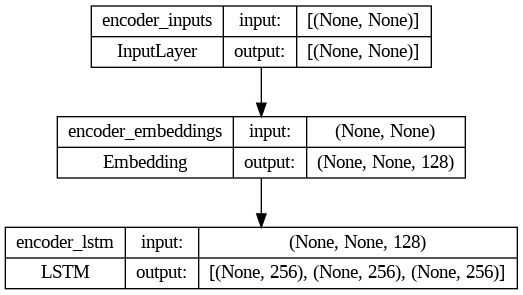

In [ ]:
plot_model(encoder_model_no_attention, to_file='encoder_model_no_attention_plot.png', show_shapes=True, show_layer_names=True)

Создание декодера аналогично. Основное отличие здесь заключается в том, что есть два дополнительных входа для декодера, представляющих его скрытое состояние LSTM (*decoder_input_state_h*) и состояние ячейки (*decoder_input_state_c*) соответственно.
<br><br>
Они существуют потому, что кодер и декодер теперь являются отдельными моделями, поэтому мы вручную возьмем выходные данные кодера (его конечные состояния) и будем использовать их в качестве начального состояния декодера. Оттуда, на каждом временном шаге, мы будем получать выходные данные состояния декодера и передавать их на следующий временной шаг.
<br><br>
Автономный декодер теперь принимает в качестве входных данных:
- Либо токен '\<sos\>' (в начале), либо выходные данные предыдущего временного шага. В любом случае, теперь для этого потребуется только один токен за раз.
- Скрытые состояния и состояния ячеек, либо из исходного кода, либо из последнего временного шага декодера.
<br>

И он выводит распределение вероятностей для текущего выходного сигнала, а также новые скрытые состояния и состояния ячеек.

In [ ]:
decoder_inputs = model.get_layer('decoder_inputs').input

decoder_embedding_layer = model.get_layer('decoder_embeddings')
decoder_embeddings = decoder_embedding_layer(decoder_inputs)

# Входные данные для представления скрытых состояний LSTM декодера и состояний ячеек. Мы заселим
# это делается вручную, используя выходные данные кодировщика для исходного состояния.
decoder_input_state_h = tf.keras.Input(shape=(hidden_dim,), name='decoder_input_state_h')
decoder_input_state_c = tf.keras.Input(shape=(hidden_dim,), name='decoder_input_state_c')
decoder_input_states = [decoder_input_state_h, decoder_input_state_c]

decoder_lstm = model.get_layer('decoder_lstm')

decoder_sequence_outputs, decoder_output_state_h, decoder_output_state_c = decoder_lstm(
    decoder_embeddings, initial_state=decoder_input_states
)

# Обновите скрытые состояния и состояния ячеек для следующего временного шага.
decoder_output_states = [decoder_output_state_h, decoder_output_state_c]

decoder_dense = model.get_layer('decoder_dense')
y_proba = decoder_dense(decoder_sequence_outputs)

decoder_model_no_attention = tf.keras.Model(
    [decoder_inputs] + decoder_input_states,
    [y_proba] + decoder_output_states
)

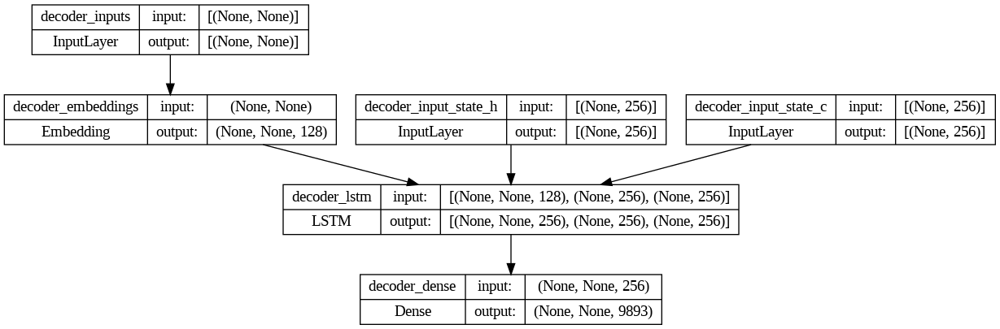

In [ ]:
plot_model(decoder_model_no_attention, to_file='decoder_model_no_attention_plot.png', show_shapes=True, show_layer_names=True)

Приведенный ниже метод переводит предложение с исходного языка на целевой. Он кодирует исходное предложение как обычно, затем передает выходные данные состояния кодера и токен \<sos\> в декодер.
<br><br>
Выходные данные декодера (результирующее слово и его скрытые состояния/состояния ячеек) затем передаются обратно в декодер на следующем временном шаге. Это продолжается до тех пор, пока либо не будет достигнуто максимальное количество слов, либо не будет сгенерирован токен \<eos\>.

In [ ]:
def translate_without_attention(sentence: str,
                                source_tokenizer, encoder,
                                target_tokenizer, decoder,
                                max_translated_len = 30):

  # Векторизовать исходное предложение и прогнать его через кодировщик.
  input_seq = source_tokenizer.texts_to_sequences([sentence])

  #  Получите маркированное предложение, чтобы увидеть, есть ли какие-либо неизвестные маркеры.
  tokenized_sentence = source_tokenizer.sequences_to_texts(input_seq)

  states = encoder.predict(input_seq)

  current_word = '<sos>'
  decoded_sentence = []

  while len(decoded_sentence) < max_translated_len:

    # Set the next input word for the decoder.
    target_seq = np.zeros((1,1))
    target_seq[0, 0] = target_tokenizer.word_index[current_word]

    # Determine the next word.
    target_y_proba, h, c = decoder.predict([target_seq] + states)
    target_token_index = np.argmax(target_y_proba[0, -1, :])
    current_word = target_tokenizer.index_word[target_token_index]

    if (current_word == '<eos>'):
      break

    decoded_sentence.append(current_word)
    states = [h, c]

  return tokenized_sentence[0], ' '.join(decoded_sentence)


Чтобы протестировать это, мы выберем несколько предложений из набора данных *test* и переведем их.

In [ ]:
# random.seed здесь только для того, чтобы воссоздать результаты.
random.seed(1)
sentences = random.sample(x_test, 15)
sentences

['она ещё у тебя',
 'загорание может вызвать рак кожи',
 'она ушла из компании',
 'я хороший моряк',
 'он только приехал',
 'есть кто дома',
 'я был тебе нужен',
 'я соглашусь с вами',
 'том приоткрыл окно',
 'давай попробуем',
 'встретимся где всегда',
 'не забудь отправить это письмо',
 'у меня есть другая идея',
 'они себя сожгли',
 'у тебя есть завтра время']

In [ ]:
def translate_sentences(source, target, translation_func, source_tokenizer, encoder,
                        target_tokenizer, decoder):
    translations = {'Tokenized Original': [], 'Reference': [], 'Translation': []}

    count = len(source)
    text_index = 0
    for sentence in source:
        print(text_index)
        source_text, target_text = sentence, target[text_index]
        print(source_text)
        print(target_text)
        source = preprocess_sentence(source_text)
        tokenized_sentence, translated = translation_func(source_text, source_tokenizer, encoder,
                                                          target_tokenizer, decoder)

        translations['Tokenized Original'].append(tokenized_sentence)
        translations['Reference'].append(target_text)
        translations['Translation'].append(translated)
        text_index += 1
    return translations

Мы загрузим результаты в Pandas **DataFrame ** для удобства просмотра.<br>
https://pandas.pydata.org/docs/reference/api/pandas .DataFrame.html

In [ ]:
translations_no_attention = pd.DataFrame(translate_sentences(x_test[:10], y_test[:10], translate_without_attention,
                                                             source_tokenizer, encoder_model_no_attention,
                                                             target_tokenizer, decoder_model_no_attention))
translations_no_attention[:10]

0
всё ломается
things break
1/1 [==============================] - 0s 20ms/step
1
том хочет больше
tom wants more
1/1 [==============================] - 0s 33ms/step
2
фома указал на пожарный выход
tom pointed to the fire escape
1/1 [==============================] - 0s 20ms/step
3
я попросил его не гнать
i asked him not to drive fast
1/1 [==============================] - 0s 19ms/step
4
эту книгу написал том
tom wrote that book
1/1 [==============================] - 0s 19ms/step
5
том планирует купить новый мотоцикл
tom plans to buy a new motorcycle
1/1 [==============================] - 0s 19ms/step
6
я не могла ничего видеть
i couldn't see anything
1/1 [==============================] - 0s 20ms/step
7
мне пришлось встать в очередь
i had to stand in line
1/1 [==============================] - 0s 19ms/step
8
завтра я буду занята
i'll be busy tomorrow
1/1 [==============================] - 0s 20ms/step
9
у меня нет жены
i don't have a wife
1/1 [==============================] - 0s 19ms

,Tokenized Original,Reference,Translation
0,всё <unk>,things break,it's a expert
1,том хочет больше,tom wants more,tom wants to be a little
2,фома указал на пожарный выход,tom pointed to the fire escape,tom is a good man to the car
3,я попросил его не <unk>,i asked him not to drive fast,i knew that he was sick
4,эту книгу написал том,tom wrote that book,this is tom's fault
5,том планирует купить новый мотоцикл,tom plans to buy a new motorcycle,tom bought a lot of money
6,я не могла ничего видеть,i couldn't see anything,i don't know that
7,мне пришлось встать в очередь,i had to stand in line,i have to go to the car
8,завтра я буду занята,i'll be busy tomorrow,i'm sorry for this
9,у меня нет жены,i don't have a wife,i don't have a lot


Таким образом, производительность здесь, как правило, смешана с несколькими ошибочными переводами, несколькими, которые точно соответствуют ссылке, и несколькими интересными, где перевод не соответствует ссылке, но передает ту же идею. Но в целом, довольно неплохо.

# Реккурентный машинный перевод Seq2Seq **С** Luong Attention

Все этапы предварительной обработки и токенизаторы, которые у нас уже есть, можно перенести сюда.

В конструкторе мы объявляем наши слои. Поток работы кодировщика остается практически неизменным. Большая разница с уровнем LSTM этого кодировщика заключается в том, что для параметра *return_sequences* установлено значение *True*. Это означает, что теперь кодер будет выводить скрытое состояние на каждом временном шаге, которое будет использоваться механизмом внимания. И маскировки нет, потому что маски не передаются через пользовательские слои (такие как механизм внимания), поэтому мы сами справимся с маскировкой в пользовательской функции потери.
<br><br>
Метод overriden *call* содержит операции нашей модели. т.е. он описывает, как модель должна преобразовывать входные данные в выходные.<br>
https://www.tensorflow.org/api_docs/python/tf/keras/Model#call

In [ ]:
class Encoder(tf.keras.Model):
    def __init__(self, vocab_size, embedding_dim, hidden_dim):
        super(Encoder, self).__init__()

        # No masking here. We'll handle it ourselves.
        self.embedding = layers.Embedding(source_vocab_size,
                                          embedding_dim,
                                          name='encoder_embedding_layer')

        # return_sequences is set to True this time.
        self.lstm = layers.LSTM(hidden_dim,
                                return_sequences=True,
                                return_state=True,
                                name='encoder_lstm')

    def call(self, input):
        embeddings = self.embedding(input)

        # output_seq will hold the encoder's hidden states from each time step.
        output_seq, state_h, state_c = self.lstm(embeddings)

        return output_seq, state_h, state_c

Мы можем получить представление о выходных данных кодировщика, создав экземпляр фиктивного кодировщика и передав ему некоторые входные данные.

In [ ]:
test_encoder = Encoder(source_vocab_size, embedding_dim, hidden_dim)

Кодировщик получит пакет последовательностей.

In [ ]:
test_encoder_batch = padded_train_encoder_inputs[:3]
print(test_encoder_batch.shape)
test_encoder_batch

(3, 6)


array([[  10,  421,    0,    0,    0,    0],
       [   7,  118, 2117,   10,  552,    0],
       [   2, 3567,  174,    0,    0,    0]], dtype=int32)

Переопределенный метод encoder *call* вызывается с помощью *\_\_call\_\_* (метод dunder), вот почему мы выполняем экземпляр encoder, как если бы это была функция.<br>
https://stackoverflow.com/questions/9663562/what-is-the-difference-between-init-and-call <br>
https://docs.python.org/3/reference/datamodel.html#object.__call__

In [ ]:
test_encoder_outputs, state_h, state_c = test_encoder(test_encoder_batch)

In [ ]:
print(test_encoder_outputs.shape)
print(state_h.shape)
print(state_c.shape)

(3, 6, 256)
(3, 256)
(3, 256)


Прежде чем мы создадим класс attention, давайте рассмотрим простой пример мультипликативного внимания (точечного произведения). Тот, который мы в конечном итоге создадим, будет почти идентичным.

Предположим, что ниже приведена последовательность скрытых состояний от кодировщика после обработки одного предложения из четырех токенов. Каждое скрытое состояние имеет третье измерение.

In [ ]:
# Выборочный вывод кодера LSTM для одиночной последовательности длиной 4.
encoder_out = tf.constant([[1., 2., 3.],
                           [2., 3., 4.],
                           [3., 4., 5.],
                           [4., 5. ,6.]])

In [ ]:
print('encoder_out shape: {}'.format(encoder_out.shape))
print('Number of timesteps: {}'.format(encoder_out.shape[0]))
print('Number of hidden dimensions: {}'.format(encoder_out.shape[1]))

encoder_out shape: (4, 3)
Number of timesteps: 4
Number of hidden dimensions: 3


И предположим, что следующее - это скрытое состояние от декодера на определенном временном шаге.

In [ ]:
# Выборка выходных данных LSTM декодера для одного временного шага.
decoder_out = tf.constant([[1., 3., 5.]])

In [ ]:
print('decoder_out shape: {}'.format(decoder_out.shape))
print('Number of timesteps: {}'.format(decoder_out.shape[0]))
print('Number of hidden dimensions: {}'.format(decoder_out.shape[1]))

decoder_out shape: (1, 3)
Number of timesteps: 1
Number of hidden dimensions: 3


Чтобы получить оценки внимания, нам нужно выполнить точечное произведение между скрытым состоянием декодера и скрытыми состояниями кодера. Чтобы сделать это, необходимо транспонировать скрытые состояния кодера.

In [ ]:
tf.transpose(encoder_out)

<tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[1., 2., 3., 4.],
       [2., 3., 4., 5.],
       [3., 4., 5., 6.]], dtype=float32)>

Функция *tf.matmul* может выполнять транспонирование и скалярное произведение за один шаг, чтобы получить оценки внимания.<br>
https://www.tensorflow.org/api_docs/python/tf/linalg/matmul

In [ ]:
attention_scores = tf.matmul(decoder_out, encoder_out, transpose_b=True)
print(attention_scores)

tf.Tensor([[22. 31. 40. 49.]], shape=(1, 4), dtype=float32)


Затем мы можем применить softmax к показателям внимания, чтобы получить весовые коэффициенты внимания.<br>
https://www.tensorflow.org/api_docs/python/tf/keras/activations/softmax

In [ ]:
attention_weights = tf.keras.activations.softmax(attention_scores, axis=-1)
print(attention_weights)

tf.Tensor([[1.8792968e-12 1.5228101e-08 1.2339458e-04 9.9987662e-01]], shape=(1, 4), dtype=float32)


Наконец, мы можем создать контекстный вектор, используя веса внимания и выходные данные кодера. Как только у нас будет наш контекстный вектор, мы сможем использовать его в нашем декодере. При необходимости обратитесь к видео/ слайдам этого модуля для получения дополнительной информации.

In [ ]:
context = tf.matmul(attention_weights, encoder_out)
print(context)

tf.Tensor([[3.9998767 4.9998765 5.999877 ]], shape=(1, 3), dtype=float32)


В приведенном ниже классе attention выполняются те же действия. Единственное отличие заключается в том, что выходные данные кодера сначала проходят через плотный слой.
<br><br>
Для ввода класс attention принимает все скрытые состояния кодера и текущее скрытое состояние декодера. Для вывода он возвращает веса внимания (которые могут быть полезны для других целей) и вектор контекста.

In [ ]:
class LuongAttention(tf.keras.Model):
  def __init__(self, hidden_dim):
    super(LuongAttention, self).__init__()

    self.w = layers.Dense(hidden_dim, name='encoder_outputs_dense')

  def call(self, inputs):
    encoder_output_seq, decoder_output = inputs
    z = self.w(encoder_output_seq)
    attention_scores = tf.matmul(decoder_output, z, transpose_b=True)
    attention_weights = tf.keras.activations.softmax(attention_scores, axis=-1)
    context = tf.matmul(attention_weights, encoder_output_seq)

    return attention_weights, context


Декодер остается в основном тем же самым, за исключением:
1. Слой встраивания не имеет маскировки.
2. В потоке есть дополнительный шаг, требующий внимания.
3. Объединенный выходной вектор контекста и декодера проходит через плотный слой *w*. Обратитесь к видео / слайдам этого модуля, если потребуется освежить информацию.
4. Последний плотный слой не имеет активации softmax. Скорее всего, мы рассчитаем потери непосредственно по логитам.
<br>

В качестве входных данных декодер принимает:
1. токен(ы) для текущего шага. Во время обучения с принуждением учителя это будет следующий ожидаемый знак (знаки). Во время вывода это будут токены, сгенерированные на последнем временном шаге.
2. все скрытые состояния кодировщика.
3. независимо от того, что декодер должен принимать в качестве своих текущих скрытых состояний и состояний ячейки.
<br>

Для выходных данных декодер возвращает:
1. логиты.
2. последнее скрытое значение LSTM и состояния ячейки.
3. взвешивание внимания.

In [ ]:
class Decoder(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, hidden_dim):
    super(Decoder, self).__init__()

    self.embedding_layer = layers.Embedding(vocab_size,
                                            embedding_dim,
                                            name='decoder_embedding_layer')

    self.lstm = layers.LSTM(hidden_dim,
                            return_sequences=True,
                            return_state=True,
                            name='decoder_lstm')

    self.attention = LuongAttention(hidden_dim)

    self.w = tf.keras.layers.Dense(hidden_dim, activation='tanh', name='attended_outputs_dense')

    self.dense = layers.Dense(vocab_size, name='decoder_dense')


  def call(self, inputs):
    decoder_input, encoder_output_seq, lstm_state = inputs
    embeddings = self.embedding_layer(decoder_input)

    decoder_output, state_h, state_c = self.lstm(embeddings, initial_state=lstm_state)

    weights, context = self.attention([encoder_output_seq, decoder_output])

    decoder_output_with_attention = self.w(tf.concat(
        [tf.squeeze(context, 1), tf.squeeze(decoder_output, 1)], -1))

    logits = self.dense(decoder_output_with_attention)

    return logits, state_h, state_c, weights

Мы можем получить представление о входах и выходах декодера за один шаг обучения с помощью теста.

In [ ]:
test_decoder = Decoder(target_vocab_size, embedding_dim, hidden_dim)

Предположим, что это пакет входных последовательностей для декодера (последовательности, используемые для teacher forcing)...

In [ ]:
test_decoder_batch = padded_train_decoder_inputs[:3]
print(test_decoder_batch.shape)
test_decoder_batch

(3, 16)


array([[   2,   66,  110,   29, 1391,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0],
       [   2,   43,    5,  127,    9,  793,   26,   15,    0,    0,    0,
           0,    0,    0,    0,    0],
       [   2,   18,    9,  752,  252,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0]], dtype=int32)

......и давайте предположим, что в данный момент мы находимся на втором временном шаге (index  1).Это будут следующие входные данные для декодера для каждой последовательности в пакете:

In [ ]:
test_decoder_batch[:, 1]

array([66, 43, 18], dtype=int32)

Но нам нужно изменить это так, чтобы это были *три последовательности из одного элемента*, что мы можем сделать с помощью *expand_dims*.<br>
https://www.tensorflow.org/api_docs/python/tf/expand_dims

In [ ]:
next_decoder_inputs = tf.expand_dims(test_decoder_batch[:, 1], 1)
next_decoder_inputs

<tf.Tensor: shape=(3, 1), dtype=int32, numpy=
array([[66],
       [43],
       [18]], dtype=int32)>

In [ ]:
# Начальные значения для state_h и state_care из декодировщика.
test_decoder_logits, state_h, state_c, test_decoder_weights = test_decoder(
    [
      next_decoder_inputs,
      test_encoder_outputs,
      [state_h, state_c]
    ])

In [ ]:
print(test_decoder_logits.shape)
print(test_decoder_weights.shape)

(3, 9893)
(3, 1, 6)


Мы собираемся использовать пользовательскую функцию потерь, потому что наши последовательности содержат заполнение, и мы не хотим, чтобы прогнозы по заполнению приводили к потерям.
<br><br>
Эта пользовательская функция потерь является просто оболочкой для ** sparse categorical crossentropy ** потерь, но с маской из 1s и 0s. Любой целевой элемент, равный 0 (т.е. значение заполнения), получит значение маски, равное 0, все остальное получит маску, равную 1, и только целевые значения, соответствующие значению маски, равному 1, будут использоваться для расчета потерь.
<br><br>
Обратитесь к этой странице, чтобы получить представление о том, как выглядят параметры *targets* и *logits*:<br>
https://www.tensorflow.org/api_docs/python/tf/keras/losses/SparseCategoricalCrossentropy

In [ ]:
def loss_func(targets, logits):
  ce_loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

  mask = tf.cast(tf.math.not_equal(targets, 0), tf.float32)

  return ce_loss(targets, logits, sample_weight=mask)

Мы будем использовать Tensorflow ** Dataset ** для пакетной обработки наших данных, как мы делали в предыдущей модели на RNNs.<br>
https://www.tensorflow.org/api_docs/python/tf/data/Dataset <br>
https://www.tensorflow.org/api_docs/python/tf/data/Dataset#from_tensor_slices <br>
https://www.tensorflow.org/api_docs/python/tf/data/Dataset#batch

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((padded_train_encoder_inputs,
                                              padded_train_decoder_inputs,
                                              padded_train_decoder_targets)).batch(batch_size, drop_remainder=True)

Наконец, это наша обучающая функция. Он будет вызываться для каждого пакета данных.
<br><br>
*train_step * не обязательно должен быть в классе, но, поместив его в подкласс *Model*, мы можем использовать метод *fit* вместо написания собственного цикла обучения.
<br><br>
*train_step* - это переопределенный метод, вызываемый методом *fit*.<br>
https://www.tensorflow.org/guide/keras/customizing_what_happens_in_fit
<br><br>
Любая операция в контексте _GradientTape_ записывается, и отслеживаются задействованные переменные. Затем мы можем заставить Tensorflow автоматически вычислять градиенты переменных относительно потерь и выполнять обратное распространение с помощью соответствующих операций.
https://www.tensorflow.org/api_docs/python/tf/GradientTape <br>
https://www.tensorflow.org/guide/autodiff
<br><br>
*train_step* заключен в аннотацию *@tf.function* для небольшого повышения производительности.<br>
https://www.tensorflow.org/api_docs/python/tf/function <br>
https://www.tensorflow.org/guide/function <br>

In [ ]:
class TranslatorTrainer(tf.keras.Model):
  def __init__(self, encoder, decoder):
    super(TranslatorTrainer, self).__init__()

    self.encoder = encoder
    self.decoder = decoder

  # This method will be called by model.fit for each batch.
  @tf.function
  def train_step(self, inputs):
      loss = 0.

      encoder_input_seq, decoder_input_seq, decoder_target_seq = inputs

      with tf.GradientTape() as tape:
          encoder_output_seq, state_h, state_c = self.encoder(encoder_input_seq)

          # We need to create a loop to iterate through the target sequences
          for i in range(decoder_target_seq.shape[1]):

              # Input to the decoder must have shape of (batch_size, length)
              # so we need to expand one dimension (just like in the previous example).
              next_decoder_input = tf.expand_dims(decoder_input_seq[:, i], 1)
              logits, state_h, state_c, _ = self.decoder(
                  [next_decoder_input, encoder_output_seq, (state_h, state_c)])

              # The loss is now accumulated through the whole batch
              loss += self.loss(decoder_target_seq[:, i], logits)

      # Update the parameters and the optimizer
      variables = encoder.trainable_variables + decoder.trainable_variables
      gradients = tape.gradient(loss, variables)
      self.optimizer.apply_gradients(zip(gradients, variables))

      return {'loss': loss / decoder_target_seq.shape[1]}

In [ ]:
encoder = Encoder(source_vocab_size, embedding_dim, hidden_dim)
decoder = Decoder(target_vocab_size, embedding_dim, hidden_dim)
optimizer = tf.keras.optimizers.Adam()

translator_trainer = TranslatorTrainer(encoder, decoder)
translator_trainer.compile(optimizer=optimizer, loss=loss_func)

Теперь у нас есть все для обучения нашего кодировщика и декодера.
<br><br>
Следующий вызов *fit* закомментирован, поскольку кодер и декодер были предварительно обучены для экономии времени. Если вы хотите обучить их самостоятельно, не стесняйтесь раскомментировать и выполнить этот метод.<br><br>
** Примечание **: Из-за инициализации случайного веса выходные данные вашей обученной модели, скорее всего, будут отличаться от моих.

In [ ]:
epochs = 1
translator_trainer.fit(dataset, epochs=epochs)

2922/2922 [==============================] - 130s 37ms/step - loss: 1.6331


Функции для сохранения, архивирования и загрузки весов обученных кодировщика и декодера.

In [ ]:
encoder.save_weights('attention_encoder_weights_with_dropout_ckpt')
decoder.save_weights('attention_decoder_weights_with_dropout_ckpt')

!zip -r ./attention_weights.zip ./attention_weights

# files.download('./attention_weights.zip')

	zip warning: name not matched: ./attention_weights

zip error: Nothing to do! (try: zip -r ./attention_weights.zip . -i ./attention_weights)


In [ ]:
# Загрузить обученную модель
# !wget
# !unzip -o attention_weights.zip

In [ ]:
# encoder.load_weights('attention_weights/attention_encoder_weights_ckpt')
# decoder.load_weights('attention_weights/attention_decoder_weights_ckpt')

Метод *translate_with_attention* аналогичен методу без внимания, за исключением того, что он включает заполнение, поскольку LSTM не использовали маскировку, а также использование скрытых состояний кодировщика.

In [ ]:
def translate_with_attention(sentence: str,
                             source_tokenizer, encoder,
                             target_tokenizer, decoder,
                             max_translated_len = 30):
    input_seq = source_tokenizer.texts_to_sequences([sentence])
    tokenized = source_tokenizer.sequences_to_texts(input_seq)

    input_seq = pad_sequences(input_seq, maxlen=max_encoding_len, padding='post')
    encoder_output, state_h, state_c  = encoder.predict(input_seq)

    current_word = '<sos>'
    decoded_sentence = []

    while len(decoded_sentence) < max_translated_len:
        target_seq = np.zeros((1,1))
        target_seq[0, 0] = target_tokenizer.word_index[current_word]

        logits, state_h, state_c, _ = decoder.predict([target_seq, encoder_output, (state_h, state_c)])
        current_token_index = np.argmax(logits[0])

        current_word = target_tokenizer.index_word[current_token_index]

        if (current_word == '<eos>'):
          break

        decoded_sentence.append(current_word)

    return tokenized[0], ' '.join(decoded_sentence)

Мы переведем те же самые случайно выбранные предложения, что и раньше, и сравним результаты с переводами, не обращая внимания.

In [ ]:
shorter_translations_w_attention = pd.DataFrame(translate_sentences(x_test[:10], y_test[:10],
                                                                    translate_with_attention,
                                                                    source_tokenizer,
                                                                    encoder,
                                                                    target_tokenizer,
                                                                    decoder=decoder))

0
всё ломается
things break
1/1 [==============================] - 0s 20ms/step
1
том хочет больше
tom wants more
1/1 [==============================] - 0s 23ms/step
2
фома указал на пожарный выход
tom pointed to the fire escape
1/1 [==============================] - 0s 28ms/step
3
я попросил его не гнать
i asked him not to drive fast
1/1 [==============================] - 0s 24ms/step
4
эту книгу написал том
tom wrote that book
1/1 [==============================] - 0s 20ms/step
5
том планирует купить новый мотоцикл
tom plans to buy a new motorcycle
1/1 [==============================] - 0s 22ms/step
6
я не могла ничего видеть
i couldn't see anything
1/1 [==============================] - 0s 22ms/step
7
мне пришлось встать в очередь
i had to stand in line
1/1 [==============================] - 0s 22ms/step
8
завтра я буду занята
i'll be busy tomorrow
1/1 [==============================] - 0s 22ms/step
9
у меня нет жены
i don't have a wife
1/1 [==============================] - 0s 22ms

In [ ]:
shorter_translations_w_attention.rename(columns={'Translation': 'Translation W/ Attention'}, inplace=True)
shorter_translations_w_attention['Translation W/O Attention'] = translations_no_attention['Translation']
shorter_translations_w_attention

,Tokenized Original,Reference,Translation W/ Attention,Translation W/O Attention
0,всё <unk>,things break,it's a little selfish,it's a expert
1,том хочет больше,tom wants more,tom will be happy,tom wants to be a little
2,фома указал на пожарный выход,tom pointed to the fire escape,tom opened the dog,tom is a good man to the car
3,я попросил его не <unk>,i asked him not to drive fast,i never never win,i knew that he was sick
4,эту книгу написал том,tom wrote that book,this book is tom in tom,this is tom's fault
5,том планирует купить новый мотоцикл,tom plans to buy a new motorcycle,tom wants to buy a new book,tom bought a lot of money
6,я не могла ничего видеть,i couldn't see anything,i don't understand anything,i don't know that
7,мне пришлось встать в очередь,i had to stand in line,i had to get a new number,i have to go to the car
8,завтра я буду занята,i'll be busy tomorrow,i have to be happy for you,i'm sorry for this
9,у меня нет жены,i don't have a wife,i don't have a little one,i don't have a lot


Кроме того, давайте взглянем на результаты перевода самых длинных предложений в обучающем наборе, чтобы увидеть, насколько они хороши.

In [ ]:
longer_data = pd.DataFrame({'source': x_train, 'target': y_train})

In [ ]:
sorted_data = longer_data.sort_values(by="source", key=lambda s: s.str.len()).reset_index(drop=True).copy()

In [ ]:
longer_sentences = sorted_data[-10:]
x_longerData = longer_sentences['source']
y_longerData = longer_sentences['target']

In [ ]:
y_longerData.to_list()

['tom should consult a specialist',
 "tom's hobby is collecting old coins",
 'tom is working as a software engineer',
 'most hotels provide a free shuttle bus',
 'the colombian government demanded more money',
 'my boyfriend refuses to use the microwave',
 'detroit is famous for its car industry',
 'the program will finish with the national anthem',
 'they opposed any further spread of slavery',
 'most of these products are domestic']

In [ ]:
longer_translations_wo_attention = translate_sentences(x_longerData.to_list(), y_longerData.to_list(), translate_without_attention,
                                                       source_tokenizer, encoder_model_no_attention,
                                                       target_tokenizer, decoder_model_no_attention)

0
тому следует проконсультироваться со специалистом
tom should consult a specialist
1/1 [==============================] - 0s 35ms/step
1
том увлекается коллекционированием старинных монет
tom's hobby is collecting old coins
1/1 [==============================] - 0s 30ms/step
2
том работает разработчиком программного обеспечения
tom is working as a software engineer
1/1 [==============================] - 0s 22ms/step
3
большинство гостиниц предлагает бесплатный трансфер
most hotels provide a free shuttle bus
1/1 [==============================] - 0s 23ms/step
4
колумбийское правительство потребовало больше денег
the colombian government demanded more money
1/1 [==============================] - 0s 20ms/step
5
мой парень отказывается пользоваться микроволновкой
my boyfriend refuses to use the microwave
1/1 [==============================] - 0s 23ms/step
6
детройт знаменит своей автомобильной промышленностью
detroit is famous for its car industry
1/1 [==============================] - 0s

In [ ]:
longer_translations_with_attention = pd.DataFrame(translate_sentences(x_longerData.to_list(), y_longerData.to_list(), translate_with_attention,
                                                                      source_tokenizer, encoder,
                                                                      target_tokenizer, decoder))
longer_translations_with_attention.rename(columns={'Translation': 'Translation W/ Attention'}, inplace=True)
longer_translations_with_attention['Translation W/O Attention'] = longer_translations_wo_attention['Translation']
longer_translations_with_attention

0
тому следует проконсультироваться со специалистом
tom should consult a specialist
1/1 [==============================] - 0s 20ms/step
1
том увлекается коллекционированием старинных монет
tom's hobby is collecting old coins
1/1 [==============================] - 0s 24ms/step
2
том работает разработчиком программного обеспечения
tom is working as a software engineer
1/1 [==============================] - 0s 23ms/step
3
большинство гостиниц предлагает бесплатный трансфер
most hotels provide a free shuttle bus
1/1 [==============================] - 0s 24ms/step
4
колумбийское правительство потребовало больше денег
the colombian government demanded more money
1/1 [==============================] - 0s 21ms/step
5
мой парень отказывается пользоваться микроволновкой
my boyfriend refuses to use the microwave
1/1 [==============================] - 0s 21ms/step
6
детройт знаменит своей автомобильной промышленностью
detroit is famous for its car industry
1/1 [==============================] - 0s

,Tokenized Original,Reference,Translation W/ Attention,Translation W/O Attention
0,тому следует проконсультироваться со специалистом,tom should consult a specialist,tom has me a little late,tom has already have to be a vegetarian
1,том увлекается коллекционированием старинных м...,tom's hobby is collecting old coins,tom is a only only last night,tom is a good man of the top of the door
2,том работает разработчиком программного обеспе...,tom is working as a software engineer,tom is a good person of a lot of french,tom is a good man of the garden
3,большинство гостиниц предлагает бесплатный тра...,most hotels provide a free shuttle bus,the one is no one of the same point,the police went to the police
4,колумбийское правительство потребовало больше ...,the colombian government demanded more money,the one of people were having a lot of people,the police are still a lot of the truth
5,мой парень отказывается пользоваться микроволн...,my boyfriend refuses to use the microwave,my father has been a little tired of my father,my mother is always than me
6,детройт знаменит своей автомобильной промышлен...,detroit is famous for its car industry,the weather is a beautiful pause,the police is a good of the dog
7,программа закончится исполнением национального...,the program will finish with the national anthem,the weather is no one of the same,the police went to the police
8,они воспротивились дальнейшему распространению...,they opposed any further spread of slavery,they were a few minutes of the same ship,they have two have a lot of the top of the thief
9,большинство этих продуктов отечественного прои...,most of these products are domestic,the one is no one of the same point,the police are still in the top of the way


Итак, очевидно, что кодер / декодер с вниманием продвигается дальше, прежде чем потерять сигнал, и ему часто удается перевести слова позже в предложении.<br><br>
Но, тем не менее, существуют явные ограничения. Во-первых, нам нужно *гораздо* больше данных. С другой стороны, большинство промышленных систем перевода используют более сложные модели. Например, система NMT от Google (когда она была полностью основана на LSTMS) использовала восемь уровней как для кодера, так и для декодера.<br><br>
Но помимо этого, мы можем использовать более мощную модель, которую мы рассмотрим в следующем модуле.

# Дальнейшее исследование
1. Загрузите другую подборку переводов с [Tatoeba](https://tatoeba.org/en/downloads ) и попробуйте использовать более сложную модель (например, с большим количеством слоев), чтобы посмотреть, повысите ли вы производительность.
<br><br>
2. Seq2Seq - это общий подход к решению проблем. Попробуйте другую модель
<br><br>
3. [BLEU](https://en.wikipedia.org/wiki/BLEU ) - популярный показатель для оценки качества перевода. Теперь, когда вы знаете, как работает BLU (смотрите видео / слайды), и у вас есть куча машинных переводов вместе со ссылками, предоставленными человеком, попробуйте рассчитать BLEU для получения результатов.
<br><br>
4. Добавьте Beam Search.